### ALGORITHM TEST

This exercise test on your understanding of everything that you have learnt so far PLUS your concept of logic. For this question, it is EXTREMELY difficult and almost impossible to get the actual answer. So instead, we will go by scoring system. 

#### Population Density vs Location of Shop Set Up

You are an intern in a huge enterprise that opens convenience shop around all around your city, your job is to help your huge enterprise to calculate the most effective function to place shops around your city that will be able to essentially reach out to as many people as possible in the City. 

You might have noticed that, I have passed you a csv file, population_density.csv. This file represents the city in a 2 Dimension map of the city. As your city is a square shaped city that is spilt into 100x100. [Open this file in excel sheet to visualise better] Each cell represents the population in that area of the city. For example,

    Excel Cell (for you to see)    Python list position [y][x] (which is what we will use)         Housing Population
             A1                                           [0][0]                                          28
             B1                                           [0][1]                                          987
             A3                                           [2][0]                                          1254
             D4                                           [3][3]                                          286
             
You are allowed to place 1 shop in each cell. People in different areas will always head over to the cell with the shop that is closest to them. So for example, if you decides to place a shop at [80][80] and [5][5]. People from different area will be going to 

         People from Position [y][x]         will go Nearest Shop Cell
                  [0][0]                             [5][5]
                  [10][4]                            [5][5]
                  [94][99]                           [80][80]
                  [33][34]                           [5][5]
                  [88][78]                           [80][80]

And the nearest shop is calculated using the closest distance from the shop to the current position. Forumla for Distance goes like this,

             Distance = Sqrt( (x1-x2)**2 + (y1-y2)**2 )
             
To know whether each shop is effectively serving the population, we will calculate the number of people who goes to shop. However, based on the distance from the housing area to 

             Shop_Score = sum( ( Population / Distance of population cell to shop cell ) )
           
For example,

        People from Position [y][x]    Nearest Shop Cell     Distance      Population          Shop Score
                [0][0]                      [5][5]             8.07           28            28 / 8.07 = 3.46
               [10][4]                      [5][5]             6.09           520           520 / 6.09 = 85.38
               [33][34]                     [5][5]             41.31          234           234 / 41.31 = 5.66
                                                                                    
                                                                                total shop score =  94.5
                                                                                
At the same time, each shop place will cost you 1000 score. Therefore, placing it on [5][5] in this case might not be that worth. Sooooo, you can't exactly place shops anywhere you like either.
               
Your code should return a list of lists in a variable call result.

For example, if I would like to put 4 shops in, I will code something like,

             result = [ [1,1] , [2,3] , [4,5] , [80,80] ]
             
Once you do that, you may run the code in the last block to help you check your answer. Your job here is to create more efficient code that can find a more effective score than me. My current best is,

- Time Taken: 0.9234724044799805 seconds
- Score: 250671.9853022066

#### You will want to run the following code to retrieve the csv file first

In [10]:
import csv
with open('population_density.csv', encoding="utf-8") as file:
    reader = csv.reader(file, delimiter=',')
    population_density = []
    for row in reader:
        new_row = []
        for value in row:
            value = int(value)
            new_row.append(value)
        population_density.append(new_row)
print(population_density[0]) #first row

[10, 213, 54, 46, 64, 90, 276, 104, 561, 94, 40, 113, 9, 1203, 141, 294, 924, 186, 422, 488, 1143, 150, 61, 216, 72, 166, 314, 75, 1, 852, 420, 12, 690, 102, 164, 79, 93, 379, 237, 94, 393, 112, 90, 62, 711, 44, 903, 36, 624, 160, 558, 52, 467, 612, 864, 30, 198, 63, 65, 78, 26, 1440, 126, 17, 225, 63, 126, 24, 72, 744, 608, 65, 500, 96, 267, 454, 495, 1239, 427, 418, 140, 888, 58, 930, 492, 68, 207, 24, 92, 97, 17, 60, 315, 49, 145, 151, 401, 909, 14, 11]


In [18]:
# Import required libraries.

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

plt.rcParams['animation.html'] = 'jshtml'
plt.rcParams['animation.embed_limit'] = 40.0

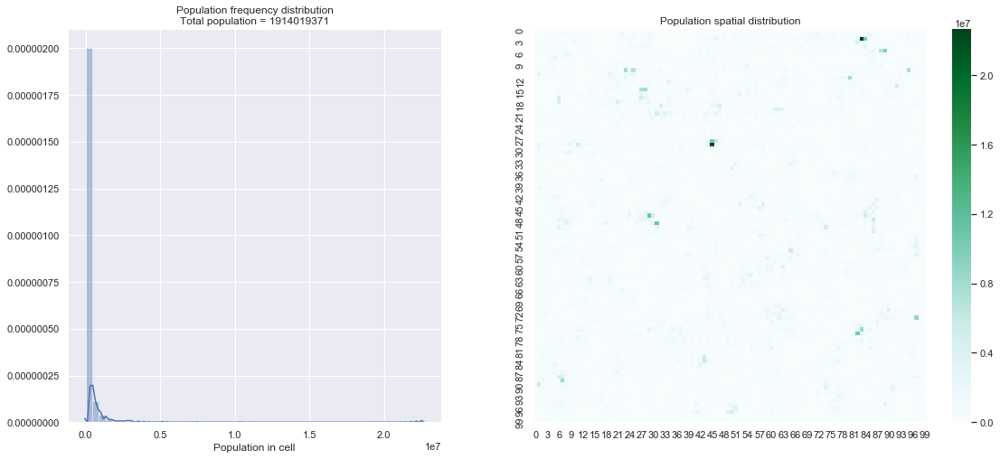

In [13]:
# Seeing is believing - visualize the data.

all_populations = [cell_population for row in population_density for cell_population in row]

sns.set()
fig, ax = plt.subplots(1, 2, figsize=(19, 8), gridspec_kw = {'width_ratios': [3, 4]})
sns.distplot(all_populations, norm_hist=False, ax=ax[0])
sns.heatmap(population_density, cmap="BuGn", square=True, ax=ax[1])
ax[0].set(title=f'Population frequency distribution\nTotal population = {sum(all_populations)}', xlabel='Population in cell')
ax[1].set_title('Population spatial distribution')

plt.show()

In [418]:
# Functions:
# Make full use of numpy to improve speed, since we want to be able to try many iterations.
# Vectorization will have a much greater effect when k gets large.

def k_random_points(grid_shape=(100, 100), k=2):
    """
    Generates k random coordinates in the positive sector of a coordinate system.
    The points could be anywhere from the origin to the vertex defined by the grid_shape keyword.
    The assumption that the origin is a vertex is a limitation of this function.
    """
    points = [np.random.randint(grid_shape[dimension], size=k) for dimension in range(len(grid_shape))]
    return tuple(zip(*points))

def nearest_point(target, points):
    """
    Returns the point (out of a given set of points) that is closest to a target point.
    """
    tp, pts = map(np.array, (target, points))
    ew_differences = tp - pts # tp will be brodcasted to match dimensions of pts prior to element-wise subtraction.
    squared_distances = np.einsum('ij,ij->i', ew_differences, ew_differences)
    return points[np.argmin(squared_distances)]

def assign_points_to_clusters(data2D, centroids):
    """
    Assign each point in the grid to the nearest centroid in a given set of centroids.
    Returns a dictionary with centroids as keys and assigned points in a list as values.
    
    Something seems off about this function... can't really put a finger on it...
    Should the values be tagged to the point's coordinates...?
    If yes, how? A dictionary with lists of dictionaries?
    """
    all_cluster_points = {}
    for centroid in centroids:
        all_cluster_points[centroid] = []
    for y in range(len(data2D)):
        for x in range(len(data2D[y])):
            destination = nearest_point((y, x), centroids)
            all_cluster_points[destination].append((y, x))
    return all_cluster_points

def weighted_average(data2D, cluster_points):
    """
    One possible method for updating the position of a centroid.
    Reassigns a centroid to the weighted-average position of the points in a cluster.
    
    Compared to local_max_point, weighted_average is much faster and more consistent.
    """
    values = np.array(tuple(data2D[point[0]][point[1]] for point in cluster_points))
    yxs = np.array(cluster_points)
    scaled_values = values / values.sum()
    w_mean_yx = np.einsum('ij,i->j', yxs, scaled_values)
    return tuple(map(round, w_mean_yx))

def update_centroids(data2D, all_cluster_points, method=weighted_average):
    """
    Calculate new centroid positions, depending on which method is used.
    2 methods are available at the moment:
        1. weighted_average (default)
        2. local_max_point
    """
    new_centroids = [method(data2D, cluster_points) for cluster_points in all_cluster_points.values()]
    return tuple(new_centroids)

def all_pair_displacements(points1, points2):
    """
    Calculate the total displacement between 2 sets of points.
    Used to indicate the extent of centroid movements.
    """
    pts1, pts2 = map(np.array, (points1, points2))
    ew_differences = pts1 - pts2
    total_displacements = np.sqrt(np.einsum('ij,ij->i', ew_differences, ew_differences))
    return np.einsum('i->', total_displacements)


In [ ]:
# Experimental functions:

def local_score(data2D, centroid, cluster_points):
    """
    Calculate the score for a given centroid position in a cluster.
    """
    pts = tuple(filter(lambda t: t != centroid, cluster_points)) # Remove centroid to avoid zero division.
    values = tuple(data2D[point[0]][point[1]] for point in pts)
    cp, pts, values = map(np.array, (centroid, pts, values))
    ew_differences = cp - pts
    distances = np.sqrt(np.einsum('ij,ij->i', ew_differences, ew_differences))
    return np.einsum('i->', values / distances) + data2D[centroid[0]][centroid[1]]

def local_max_point(data2D, cluster_points):
    """
    One possible method for updating the position of a centroid.
    Reassigns a centroid to the position that maximizes the score within the cluster.
    
    Each iteration is slower, but requires fewer iterations.
    There is a major limitation here, centroid may end up clustering together.
    
    But that insipires some ideas for a new method:
        Scan for local maxima outside a cluster.
        What is outside a cluster?
        How to limit the size of a cluster?
    """
    scores = []
    for point1 in cluster_points:
        point_total_score = local_score(data2D, point1, cluster_points)
        scores.append(point_total_score)
    return cluster_points[scores.index(max(scores))]


In [427]:
def k_means(data2D_original, k=2, max_iter=10):
    data2D = np.array(data2D_original)
    initial_coords = k_random_points(grid_shape=data2D.shape, k=k)
    centroids = initial_coords
    all_cluster_points_frames = []
    
    for iteration in range(max_iter):
        all_cluster_points = assign_points_to_clusters(data2D, centroids)
        all_cluster_points_frames.append(all_cluster_points)
        new_centroids = update_centroids(data2D, all_cluster_points, method=weighted_average)
#         new_centroids = update_centroids(data2D, all_cluster_points, method=local_max_point)
        total_displacement = all_pair_displacements(new_centroids, centroids)
        print(f'k = {k} - Iteration {iteration + 1}: Total displacement = {total_displacement:.5f}')
        
        if total_displacement < (0.1 * k):
            break
        else:
            centroids = new_centroids
    
    print(f'Total number of iterations: {iteration + 1}')
    return all_cluster_points_frames

def get_final_centroids(all_cluster_points_frames):
    dct = all_cluster_points_frames[-1]
    return tuple(dct.keys())

all_cluster_points_frames = k_means(population_density, 59, 30)
final_centroids = get_final_centroids(all_cluster_points_frames)

k = 59 - Iteration 1: Total displacement = 220.54346
k = 59 - Iteration 2: Total displacement = 108.30453
k = 59 - Iteration 3: Total displacement = 59.89624
k = 59 - Iteration 4: Total displacement = 40.95742
k = 59 - Iteration 5: Total displacement = 26.46941
k = 59 - Iteration 6: Total displacement = 12.65685
k = 59 - Iteration 7: Total displacement = 13.24264
k = 59 - Iteration 8: Total displacement = 5.00000
Total number of iterations: 8


In [401]:
def animate_k_means(data2D, all_cluster_points_frames):
    # Unpack coordinates for each frame/iteration.
    # Come up with shorter names...
    centroids_frames = tuple(all_cluster_points_frame.keys() for all_cluster_points_frame in all_cluster_points_frames)
    all_clusters_frames = []
    for all_cluster_points_frame in all_cluster_points_frames:
        all_clusters_frame = tuple(cluster_points for cluster_points in all_cluster_points_frame.values())
        all_clusters_frames.append(all_clusters_frame)
    
    # Generate the figure.
    k = len(centroids_frames[0])
    
    palette = sns.color_palette(n_colors=k)
    
    fig, ax = plt.subplots(figsize=(14, 11))
    sns.heatmap(data2D, cmap="BuGn", square=True, ax=ax, alpha=1, cbar=False)
    fig.show(False)
    
    centroid_artist, = ax.plot([], [], linestyle='None', markersize=100, marker='o', c='cyan', alpha=0.5)
    cluster_artists = []
    for i2 in range(k):
        artist, = ax.plot([], [], linestyle='None', marker='x', c=palette[i2], alpha=0.6)
        cluster_artists.append(artist)
    
    def animate(frame):
        centroids_disp = [tuple(map(round, centroid)) for centroid in centroids_frames[frame]]
        ax.set_title(f'Iteration {frame + 1}\n{centroids_disp}')
        for i2 in range(k):
            yxs = tuple(zip(*all_clusters_frames[frame][i2]))
            cluster_artists[i2].set_data(yxs[1], yxs[0])
        cyxs = tuple(zip(*centroids_frames[frame]))
        centroid_artist.set_data(cyxs[1], cyxs[0])
    
    ani = FuncAnimation(fig, animate, frames=len(all_cluster_points_frames), interval=500)
    plt.close('all')
    
    return ani

In [394]:
# weighted_average
animate_k_means(population_density, all_cluster_points_frames)

In [392]:
# max_local_point
# Major limitation just happens to be present in this case. Centroids cluster together.
animate_k_means(population_density, all_cluster_points_frames)

In [57]:
animate_k_means(population_density, all_cluster_points_frames)

#### Write your code in the box below 

In [432]:
def your_code():
    result = []
    # result = [ [1,1] , [2,3] , [4,5] , [80,80] ]
    # you can uncomment the code above and run the last code block to see how the entire system work
    # write your code below
    
    number_of_shops = range(2, 103, 10)
    
    all_scores = []
    all_times = []
    max_score = 0
    best_num_of_shops = 0
    
    for k in number_of_shops:
        start_time = time.time()
        
        all_cluster_points_frames2 = k_means(population_density, k, 30)
        final_centroids2 = get_final_centroids(all_cluster_points_frames2)
        current_score = total_score(final_centroids2)
        
        duration = time.time() - start_time
        
        all_scores.append(current_score)
        all_times.append(duration)
        
        if max_score < current_score:
            max_score = current_score
            result = final_centroids2
            best_num_of_shops = k
    
    fig, ax = plt.subplots(2, 1, figsize=(19, 12))
    ax[0].plot(number_of_shops, all_scores, marker='x', linestyle='--', label=all_scores)
    ax[0].set(xlabel='number of shops', ylabel='score')
    ax[1].plot(number_of_shops, all_times, marker='x', linestyle='--', label=all_times)
    ax[1].set(xlabel='number of shops', ylabel='time taken (s)')
        
    for i2 in range(len(number_of_shops)):
        ax[0].annotate((number_of_shops[i2], round(all_scores[i2], 2)), (number_of_shops[i2] + 2, all_scores[i2]))
        ax[1].annotate((number_of_shops[i2], round(all_times[i2], 2)), (number_of_shops[i2] + 2, all_times[i2]))
    
    print('Best number of shops:', best_num_of_shops)
    plt.show()
    
    # write your code above
    return result

#### To aid you in your quest

your company have created a few basic functions for you to use. You should run the code below to generate the functions

In [404]:
def calculate_distance(x1, y1, x2, y2):
    xdiff = abs(x1 - x2)
    ydiff = abs(y1 - y2)
    return (xdiff ** 2 + ydiff ** 2) ** 0.5 + 1

def position_scoring(x, y, distance):
    return population_density[y][x] / distance 

def nearest_shop(x, y, result):
    nearest = []
    lowest_distance = 99999999999
    for shop in result:
        distance = calculate_distance(x, y, shop[0], shop[1])
        if distance < lowest_distance:
            lowest_distance = distance
            nearest = shop
    return nearest

def total_score(result):
    total_score = 0
    for y in range(len(population_density)):
        for x in range(len(population_density[0])):
            # shop_value = population_density[y][x] # <-- not used
            nearest = nearest_shop(x, y, result)
            if len(nearest) != 0:
                distance = calculate_distance(x, y, nearest[0], nearest[1])
                score = position_scoring(x, y, distance)
            else:
                score = 0
            total_score += score
            
    total_score -= (len(result) * 1000)
    return total_score

#### To check your final score, run the code below

k = 2 - Iteration 1: Total displacement = 49.12400
k = 2 - Iteration 2: Total displacement = 4.23607
k = 2 - Iteration 3: Total displacement = 2.00000
k = 2 - Iteration 4: Total displacement = 2.41421
k = 2 - Iteration 5: Total displacement = 2.41421
k = 2 - Iteration 6: Total displacement = 2.41421
k = 2 - Iteration 7: Total displacement = 2.00000
k = 2 - Iteration 8: Total displacement = 3.23607
k = 2 - Iteration 9: Total displacement = 3.00000
k = 2 - Iteration 10: Total displacement = 2.82843
k = 2 - Iteration 11: Total displacement = 0.00000
Total number of iterations: 11
k = 12 - Iteration 1: Total displacement = 124.78117
k = 12 - Iteration 2: Total displacement = 53.91996
k = 12 - Iteration 3: Total displacement = 28.25210
k = 12 - Iteration 4: Total displacement = 17.36506
k = 12 - Iteration 5: Total displacement = 14.12242
k = 12 - Iteration 6: Total displacement = 9.23607
k = 12 - Iteration 7: Total displacement = 4.00000
k = 12 - Iteration 8: Total displacement = 2.00000
k 

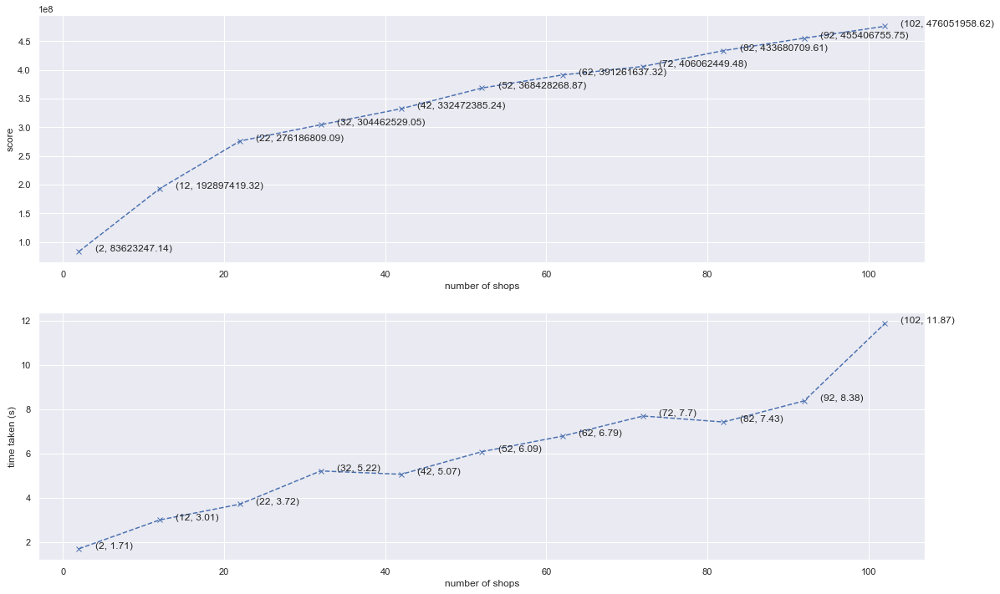

--- Time Taken 71.61654996871948 seconds ---
-----------------------------------
Your total score is 476051958.6236299
You have  102 of shops

You placed shops at ((37.0, 96.0), (93.0, 90.0), (53.0, 96.0), (63.0, 54.0), (60.0, 61.0), (2.0, 23.0), (72.0, 62.0), (68.0, 75.0), (45.0, 64.0), (49.0, 73.0), (2.0, 72.0), (29.0, 45.0), (56.0, 21.0), (4.0, 9.0), (12.0, 32.0), (83.0, 76.0), (71.0, 89.0), (29.0, 32.0), (3.0, 85.0), (60.0, 81.0), (5.0, 56.0), (89.0, 7.0), (29.0, 8.0), (66.0, 21.0), (8.0, 48.0), (9.0, 41.0), (16.0, 38.0), (48.0, 7.0), (33.0, 66.0), (59.0, 5.0), (20.0, 46.0), (82.0, 34.0), (3.0, 46.0), (58.0, 90.0), (19.0, 20.0), (95.0, 6.0), (95.0, 41.0), (73.0, 95.0), (19.0, 7.0), (17.0, 54.0), (63.0, 13.0), (39.0, 43.0), (29.0, 57.0), (95.0, 61.0), (50.0, 40.0), (19.0, 77.0), (78.0, 51.0), (82.0, 87.0), (28.0, 83.0), (56.0, 65.0), (44.0, 89.0), (92.0, 76.0), (62.0, 71.0), (87.0, 95.0), (82.0, 42.0), (94.0, 19.0), (38.0, 77.0), (46.0, 85.0), (37.0, 29.0), (11.0, 23.0), (96.0, 50.0

In [433]:
import time
start_time = time.time()
final_result = your_code()
final_score = total_score(final_result)

print("--- Time Taken %s seconds ---" % (time.time() - start_time))

print("-----------------------------------")
print("Your total score is",final_score)
print("You have ",len(final_result),"of shops")
print("")
print("You placed shops at",final_result)


Iteration 1: Total displacement = 34.96226
Iteration 2: Total displacement = 3.64109
Iteration 3: Total displacement = 2.96456
Iteration 4: Total displacement = 1.18954
Iteration 5: Total displacement = 0.55695
Iteration 6: Total displacement = 0.36503
Iteration 7: Total displacement = 0.31078
Iteration 8: Total displacement = 0.17238
Total number of iterations: 8
Iteration 1: Total displacement = 89.88204
Iteration 2: Total displacement = 41.12071
Iteration 3: Total displacement = 20.65893
Iteration 4: Total displacement = 13.81367
Iteration 5: Total displacement = 13.94099
Iteration 6: Total displacement = 12.95713
Iteration 7: Total displacement = 9.75744
Iteration 8: Total displacement = 8.62065
Iteration 9: Total displacement = 5.34848
Iteration 10: Total displacement = 3.79151
Iteration 11: Total displacement = 2.88006
Iteration 12: Total displacement = 2.50726
Iteration 13: Total displacement = 2.48848
Iteration 14: Total displacement = 2.42593
Iteration 15: Total displacement =

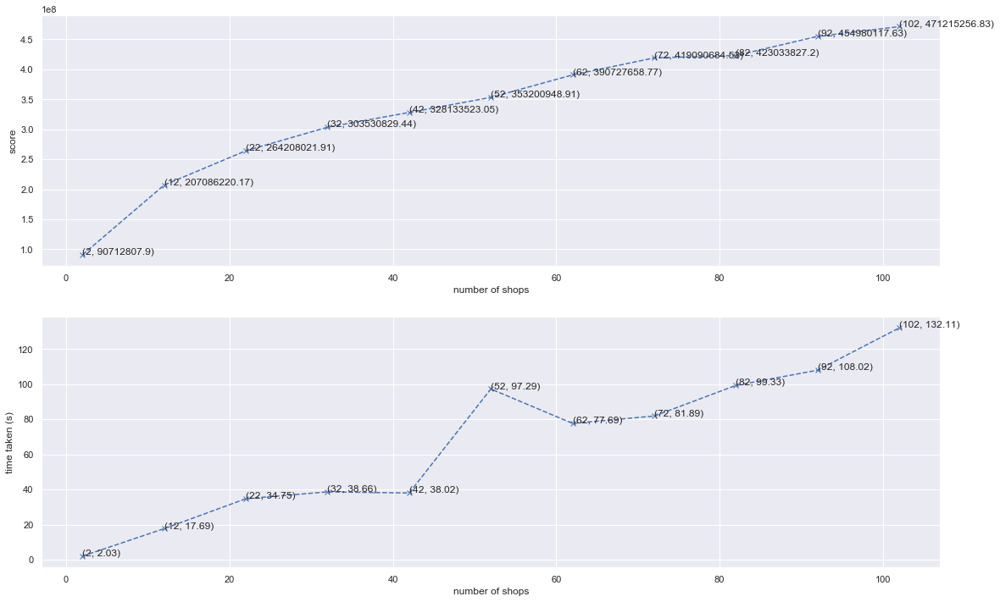

--- Time Taken 732.3203353881836 seconds ---
-----------------------------------
Your total score is 471215256.8265579
You have  102 of shops

You placed shops at dict_keys([(19.59957556867167, 45.824750458396565), (43.96848331927234, 92.15119570161691), (62.11140836866559, 12.296841770180027), (10.896371314033042, 93.19708136219515), (63.18235378510101, 43.75740690505854), (5.252879667182528, 56.5090160395842), (63.14152384763344, 53.660443485496785), (20.599947888915562, 62.712081135201935), (69.16398414133688, 12.943475690338731), (3.287009397070798, 85.05207979397635), (40.13977214375595, 15.697817929431148), (18.44973591131166, 76.5654826010058), (54.49659430357764, 47.470406391108), (13.528394055961193, 37.86555471161855), (27.58687259282162, 82.76464234702816), (49.394322057332495, 30.97601217601262), (4.835047653339886, 50.54705372639682), (74.76226477960795, 65.56772861665976), (28.902553080713155, 12.160870752273073), (75.52410928713186, 35.461060164239356), (44.0243877839648

In [26]:
import time
start_time = time.time()
final_result = your_code()
final_score = total_score(final_result)

print("--- Time Taken %s seconds ---" % (time.time() - start_time))

print("-----------------------------------")
print("Your total score is",final_score)
print("You have ",len(final_result),"of shops")
print("")
print("You placed shops at",final_result)


#### If you can create a code that takes short amount of time and higher score than me (Kaiyang), send your code! I would like to see!

- Time Taken: 0.9234724044799805 seconds
- Score: 250671.9853022066

## So what does this extra extra extra exercise got to do with data science?

#### In today's context, there are a lot of data and information that companies store. However, most of the companies (especially SMEs) have no ideas on how they can make use of the data to optimise their business operations.